Safe drinking water is crucial for health and is considered a fundamental human right. It plays a vital role in protecting public health at national, regional, and local levels. Investing in water supply and sanitation can have economic benefits, as the positive impact on health and reduction in healthcare expenses often outweigh the costs of implementing such interventions

Content
The water_potability.csv file contains water quality metrics for 3276 different water bodies.

1. pH value:

PH is an important parameter in evaluating the acid–base balance of water. It is also the indicator of acidic or alkaline condition of water status. WHO has recommended maximum permissible limit of pH from 6.5 to 8.5. The current investigation ranges were 6.52–6.83 which are in the range of WHO standards.


2. Hardness:

Hardness is mainly caused by calcium and magnesium salts. These salts are dissolved from geologic deposits through which water travels. The length of time water is in contact with hardness producing material helps determine how much hardness there is in raw water. Hardness was originally defined as the capacity of water to precipitate soap caused by Calcium and Magnesium.


3. Solids (Total dissolved solids - TDS):

Water has the ability to dissolve a wide range of inorganic and some organic minerals or salts such as potassium, calcium, sodium, bicarbonates, chlorides, magnesium, sulfates etc. These minerals produced un-wanted taste and diluted color in appearance of water. This is the important parameter for the use of water. The water with high TDS value indicates that water is highly mineralized. Desirable limit for TDS is 500 mg/l and maximum limit is 1000 mg/l which prescribed for drinking purpose.


4. Chloramines:

Chlorine and chloramine are the major disinfectants used in public water systems. Chloramines are most commonly formed when ammonia is added to chlorine to treat drinking water. Chlorine levels up to 4 milligrams per liter (mg/L or 4 parts per million (ppm)) are considered safe in drinking water.


5. Sulfate:

Sulfates are naturally occurring substances that are found in minerals, soil, and rocks. They are present in ambient air, groundwater, plants, and food. The principal commercial use of sulfate is in the chemical industry. Sulfate concentration in seawater is about 2,700 milligrams per liter (mg/L). It ranges from 3 to 30 mg/L in most freshwater supplies, although much higher concentrations (1000 mg/L) are found in some geographic locations.


6. Conductivity:

Pure water is not a good conductor of electric current rather’s a good insulator. Increase in ions concentration enhances the electrical conductivity of water. Generally, the amount of dissolved solids in water determines the electrical conductivity. Electrical conductivity (EC) actually measures the ionic process of a solution that enables it to transmit current. According to WHO standards, EC value should not exceeded 400 μS/cm.


7. Organic_carbon:

Total Organic Carbon (TOC) in source waters comes from decaying natural organic matter (NOM) as well as synthetic sources. TOC is a measure of the total amount of carbon in organic compounds in pure water. According to US EPA < 2 mg/L as TOC in treated / drinking water, and < 4 mg/Lit in source water which is use for treatment.


8. Trihalomethanes:

THMs are chemicals which may be found in water treated with chlorine. The concentration of THMs in drinking water varies according to the level of organic material in the water, the amount of chlorine required to treat the water, and the temperature of the water that is being treated. THM levels up to 80 ppm is considered safe in drinking water.


9. Turbidity:

The turbidity of water depends on the quantity of solid matter present in the suspended state. It is a measure of light emitting properties of water and the test is used to indicate the quality of waste discharge with respect to colloidal matter. The mean turbidity value obtained for Wondo Genet Campus (0.98 NTU) is lower than the WHO recommended value of 5.00 NTU.


10. Potability:

Indicates if water is safe for human consumption where 1 means Potable and 0 means Not potable.

Predict if water is safe for human consumption or not

1-ph: pH of 1. water (0 to 14).

2-Hardness: Capacity of water to precipitate soap in mg/L.

3-Solids: Total dissolved solids in ppm.

4-Chloramines: Amount of Chloramines in ppm.

5-Sulfate: Amount of Sulfates dissolved in mg/L.

6-Conductivity: Electrical conductivity of water in μS/cm.

7-Organic_carbon: Amount of organic carbon in ppm.

8-Trihalomethanes: Amount of Trihalomethanes in μg/L.

9-Turbidity: Measure of light emiting property of water in NTU.

10-Potability: Indicates if water is safe for human consumption. Potable -1 and Not potable -0

In [5]:
# Import required libraries and dependencies
import pandas as pd
import matplotlib.pyplot as plt
import hvplot.pandas
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import balanced_accuracy_score, confusion_matrix, classification_report

In [6]:
# Load and read the data into a Pandas DataFrame
df=pd.read_csv('Resources/water_potability.csv')
# Display sample data
df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [7]:
df.shape

(3276, 10)

In [8]:
# Check for missing values in each column
missing_values = df.isnull().sum()

print(missing_values)

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64


In [9]:
# Check again for missing values in each column
missing_values = df.isnull().sum()

print(missing_values)

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64


In [10]:
# Drop rows with missing values
df.dropna(inplace=True)

In [11]:
df.shape

(2011, 10)

In [12]:
# Generate summary statistics
df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000
mean,7.085990,195.968072,21917.441374,7.134338,333.224672,426.526409,14.357709,66.400859,3.969729,0.403282
std,1.573337,32.635085,8642.239815,1.584820,41.205172,80.712572,3.324959,16.077109,0.780346,0.490678
min,0.227499,73.492234,320.942611,1.390871,129.000000,201.619737,2.200000,8.577013,1.450000,0.000000
25%,6.089723,176.744938,15615.665390,6.138895,307.632511,366.680307,12.124105,55.952664,3.442915,0.000000
50%,7.027297,197.191839,20933.512750,7.143907,332.232177,423.455906,14.322019,66.542198,3.968177,0.000000
75%,8.052969,216.441070,27182.587067,8.109726,359.330555,482.373169,16.683049,77.291925,4.514175,1.000000
max,14.000000,317.338124,56488.672413,13.127000,481.030642,753.342620,27.006707,124.000000,6.494749,1.000000


In [13]:
# Plot the data to see what's in DataFrame
df.hvplot.line(
    width=800,
    height=400,
    rot=90
)

:NdOverlay   [Variable]
   :Curve   [index]   (value)

C:\Users\mohamed.bensaidani\AppData\Local\Temp\ipykernel_13816\3878227197.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  df.hist(ax=axs[0, 0])


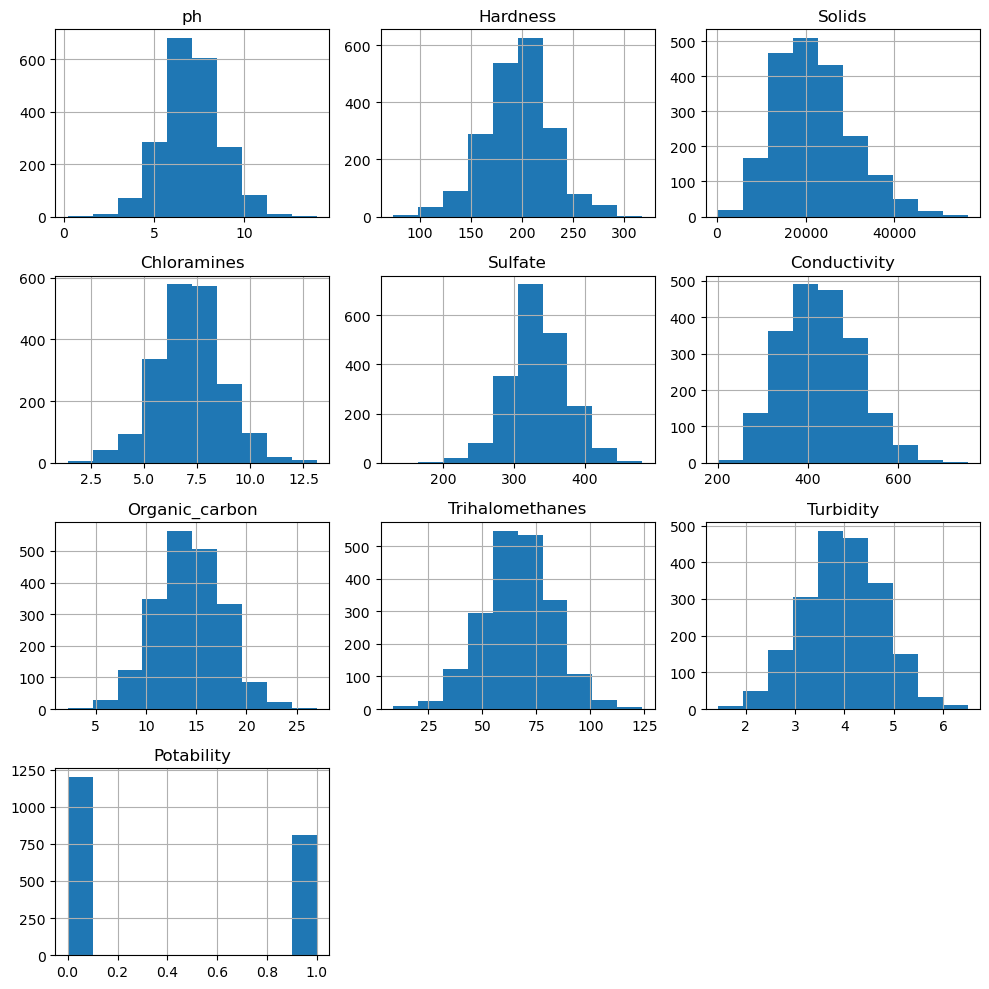

In [14]:
# creat a histogram to show the distribution of value in each column
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
# plot on the first subplot
df.hist(ax=axs[0, 0])
plt.tight_layout()
plt.show()

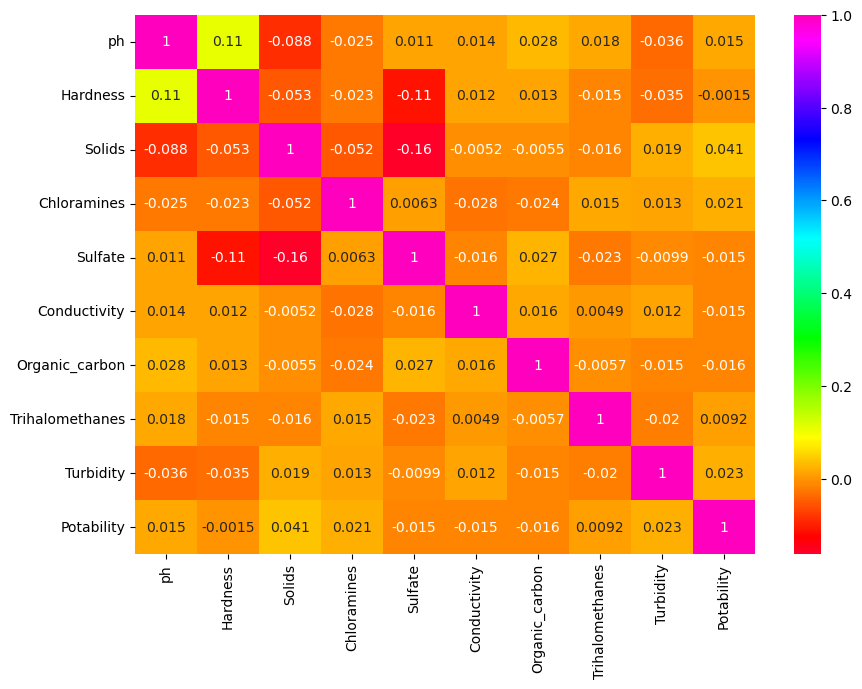

In [15]:
# exploring the data
sns.heatmap(df.corr(),annot=True,cmap='gist_rainbow')
fig=plt.gcf()
fig.set_size_inches(10,7)
plt.show()

In [16]:
#  1 means Potable 
#  0 means Not potable.

df['Potability'].value_counts()

0    1200
1     811
Name: Potability, dtype: int64

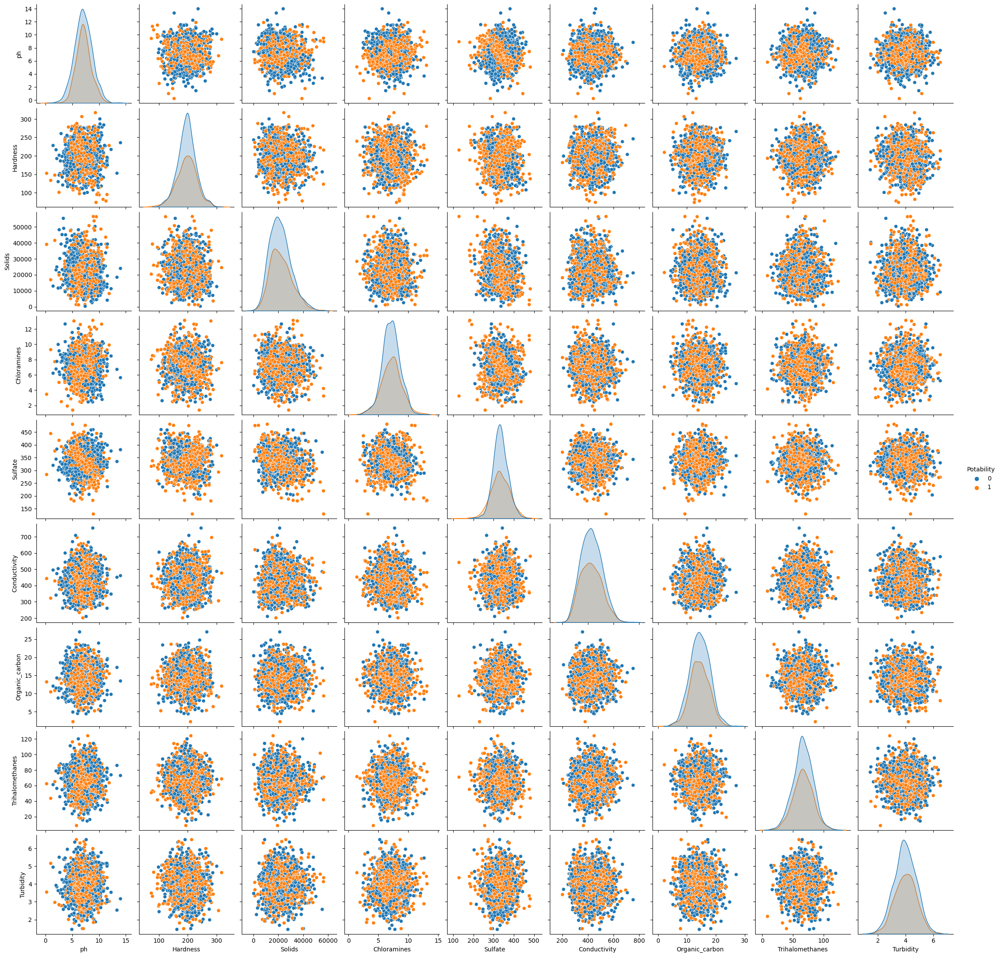

In [17]:
#generates a pair plot using Seaborn to visualize pairwise relationships between variables in the DataFrame data.

#By assigning the 'Potability' column as the hue variable

# This means that the hue variable ('Potability') is used to color the data points,
#allowing for visual differentiation of the data based on the potability (whether it is drinkable or not)

sns.pairplot(df,hue='Potability')

plt.show()

In [18]:
# Separate the data into labels and features

# Separate the X variable, the features
X = df.drop('Potability',axis=1)

# Separate the y variable, the labels
y =df['Potability']

In [19]:
# Review the y variable Series
y[:5]

3    0
4    0
5    0
6    0
7    0
Name: Potability, dtype: int64

In [20]:
# Review the X variable DataFrame
X.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075
5,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708
6,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,2.672989
7,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,4.401425


In [21]:
# Check the balance of our target values
y.value_counts()

0    1200
1     811
Name: Potability, dtype: int64

In [22]:
#Split the data into training and testing datasets by using train_test_split
# Split the data using train_test_split
# Assign a random_state of 1 to the function

X_train, X_test, y_train, y_test = train_test_split(X,y,random_state=1,stratify=y)

In [23]:
y_train.value_counts()

0    900
1    608
Name: Potability, dtype: int64

In [24]:
y_test.value_counts()

0    300
1    203
Name: Potability, dtype: int64

# 1- Logistic Regression 

In [25]:
#Create a Logistic Regression Model with the Original Data
# Import the LogisticRegression module from SKLearn
from sklearn.linear_model import LogisticRegression

# Instantiate the Logistic Regression model
# Assign a random_state parameter of 1 to the model
logistic_regression_model =LogisticRegression(random_state = 1)

# Fit the model using training data
lr_model= logistic_regression_model.fit(X_train, y_train)

In [26]:
#Save the predictions on the testing data labels by using the testing feature data (X_test) and the fitted model.
# Make a prediction using the testing data

testing_predictions = lr_model.predict(X_test)

In [27]:
#Evaluate the model’s performance by doing the following:

#Calculate the accuracy score of the model.

#Generate a confusion matrix.

#Print the classification report.

# Print the balanced_accuracy score of the model
print(f"Training Data Score: {lr_model.score(X_train, y_train)}")
print(f"Testing Data Score: {lr_model.score(X_test, y_test)}")


# Display the accuracy score for the test dataset.
print(f"Balanced Accuracy Score: {balanced_accuracy_score(y_test,testing_predictions)}")

Training Data Score: 0.5981432360742706
Testing Data Score: 0.5984095427435387
Balanced Accuracy Score: 0.5032594417077176


In [28]:
results = pd.DataFrame({"Prediction": testing_predictions, "Actual": y_test}).reset_index(drop=True)
results.head(10)

,Prediction,Actual
0,0,1
1,0,0
2,0,0
3,0,0
4,0,0
5,0,1
6,0,0
7,0,0
8,0,0
9,0,0


In [29]:
 #Generate a confusion matrix for the model

#Import the confusion_matrix module from SKLearn
from sklearn.metrics import confusion_matrix

testing_matrix = confusion_matrix(y_test, testing_predictions)
print(testing_matrix)

[[299   1]
 [201   2]]


In [30]:
# Print the classification report for the model
testing_report = classification_report(y_test, testing_predictions)

print(testing_report)

              precision    recall  f1-score   support

           0       0.60      1.00      0.75       300
           1       0.67      0.01      0.02       203

    accuracy                           0.60       503
   macro avg       0.63      0.50      0.38       503
weighted avg       0.63      0.60      0.45       503



Based on the classification report, the logistic regression model seems to predict both the 0 (Not Potable) and 1 (Potable) labels quite well. The precision of the model is low for both classes, with a value of 0.60 for class 0 and 067 for class 1. This indicates that when the model predicts a Not Potable (class 0), it is correct 60% of the time, and when it predicts a Potable (class 1), it is correct 67% of the time.

The recall of the model is low for Potable , with a value of 0.01 for class 1, and high for Not Potable with a value of 1.00 for class 0. 

The f1-score, which is a weighted average of precision and recall, is good for Not Potable , with a value of 0.75 for class 0 and low for Potable with a value of 0.01 for class 1. This indicates that the model is not able to achieve a good balance between precision and recall for both classes.

However, it's important to note that the dataset is imbalanced, meaning that there are more Not Potable water than Potable.
This could potentially affect the model's performance, and it's essential to look at resampled data to assess the model's performance accurately.

Overall, the model's accuracy of 0.60 and the macro and weighted averages suggest that it is not performing well across both classes. However, it's essential to keep in mind the potential impact of an imbalanced dataset and to evaluate the model's performance using resampled data to get a more accurate assessment.

# another way to explain the report
please see which one is better

The classification report provides a detailed summary of the model's performance on the test set. Here's what the different metrics in the report mean:

Precision:

Precision is the proportion of correctly predicted positive instances (true positives) out of all instances predicted as positive. For class 0 (Not Potable water), the precision is 0.60, indicating that 60% of the instances predicted as class 0 are actually class 0. For class 1 (Potable water), the precision is 0.67, meaning that 67% of the instances predicted as class 1 are actually class 1.

Recall:

Recall, also known as sensitivity or true positive rate, is the proportion of correctly predicted positive instances (true positives) out of all actual positive instances. For class 0, the recall is 1.00, indicating that all instances of class 0 are correctly identified as class 0. However, for class 1, the recall is only 0.01, meaning that only 1% of the actual class 1 instances are correctly predicted as class 1.

F1-score:

The F1-score is the harmonic mean of precision and recall. It provides a balanced measure of the model's performance, taking into account both precision and recall. For class 0, the F1-score is 0.75, while for class 1, it is 0.02. A higher F1-score indicates better performance, balancing both precision and recall.

Support: Support represents the number of instances in each class in the test set. For class 0, the support is 300, meaning there are 300 instances of class 0 in the test set. For class 1, the support is 203, indicating there are 203 instances of class 1.

Accuracy:

Accuracy is the overall proportion of correctly predicted instances out of all instances. In this case, the accuracy is 0.60, meaning that the model correctly predicts the class for 60% of the instances in the test set.

Macro avg:

Macro average calculates the average performance across all classes, without considering class imbalance. The macro average precision, recall, and F1-score are calculated by averaging the corresponding metrics for each class. In this case, the macro average precision is 0.63, recall is 0.50, and F1-score is 0.38.

Weighted avg:

Weighted average calculates the average performance across all classes, considering class imbalance by weighting each class's metrics by its support. The weighted average precision, recall, and F1-score are calculated by taking a weighted average of the corresponding metrics for each class, where the weights are the proportion of instances in each class. In this case, the weighted average precision is 0.63, recall is 0.60, and F1-score is 0.45.

Overall, 

the classification report provides a detailed assessment of the model's performance in distinguishing between Not Potable water (class 0) and Potable water (class 1) based on the evaluation metrics precision, recall, F1-score, support, and accuracy.







# 2- Predict a Logistic Regression Model with Resampled Training Data


In [31]:
#Predict a Logistic Regression Model with Resampled Training Data
#Use the RandomOverSampler module from the imbalanced-learn library to resample the data.
# Import the RandomOverSampler module form imbalanced-learn
from imblearn.over_sampling import RandomOverSampler

# Instantiate the random oversampler model
# # Assign a random_state parameter of 1 to the model
ROS = RandomOverSampler(random_state=1)

# Fit the original training data to the random_oversampler model
X_resampled, y_resampled= ROS.fit_resample(X_train, y_train)

In [32]:
# Count the distinct values of the resampled labels data
y_resampled.value_counts()

0    900
1    900
Name: Potability, dtype: int64

In [33]:
# Use the LogisticRegression classifier and the resampled data to fit the model and make predictions.
# Instantiate the Logistic Regression model
# Assign a random_state parameter of 1 to the model
ros_model = LogisticRegression(solver='lbfgs', random_state=1)

# Fit the model using the resampled training data
ros_model.fit(X_resampled, y_resampled)

# Make a prediction using the testing data
y_pred = ros_model.predict(X_test)

In [34]:
# Evaluate the model’s performance by doing the following:
# Calculate the accuracy score of the model.

# Generate a confusion matrix.

# Print the classification report.
# Print the balanced_accuracy score of the model 
print(f"Training Data Score: {ros_model.score(X_train, y_train)}")
print(f"Testing Data Score: {ros_model.score(X_test, y_test)}")
print(f"Balanced Accuracy Score: {balanced_accuracy_score(y_test, y_pred)}")


Training Data Score: 0.5251989389920424
Testing Data Score: 0.5188866799204771
Balanced Accuracy Score: 0.5050821018062397


In [35]:
# Generate a confusion matrix for the model
from sklearn.metrics import confusion_matrix
ros_testing_matrix = confusion_matrix(y_test, y_pred)
print(ros_testing_matrix)

[[173 127]
 [115  88]]


In [36]:
# Print the classification report for the model
ros_testing_report = classification_report(y_test, y_pred)

print(ros_testing_report)

              precision    recall  f1-score   support

           0       0.60      0.58      0.59       300
           1       0.41      0.43      0.42       203

    accuracy                           0.52       503
   macro avg       0.50      0.51      0.50       503
weighted avg       0.52      0.52      0.52       503



# 3- Using Random Forest 

In [37]:
#  Separate the data into labels and features

#  Separate the X variable, the features
X = df.drop('Potability',axis=1)

#  Separate the y variable, the labels
y =df['Potability']

In [38]:
# Use the `StandardScaler()` module from scikit-learn to normalize the data from the CSV file
X = StandardScaler().fit_transform(X)

In [39]:
#Train-Test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=33)

In [40]:
#Making the Model
#Using Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier

In [41]:
rfc= RandomForestClassifier(n_estimators=18)

In [42]:
rfc.fit(X_train, y_train)
rf_pred = rfc.predict(X_test)

In [43]:
rf_pred

array([0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0,
       0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0,
       1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1,
       0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1,
       1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 0], dtype=int64)

In [44]:
#Accuracy Score of Random forest classifier:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [45]:
accuracy_score(y_test, rf_pred)

0.6683168316831684

In [46]:
#Classification report of Random forest classifier:
print(classification_report(y_test, rf_pred))

              precision    recall  f1-score   support

           0       0.68      0.82      0.75       120
           1       0.63      0.44      0.52        82

    accuracy                           0.67       202
   macro avg       0.66      0.63      0.63       202
weighted avg       0.66      0.67      0.65       202



In [47]:
#Confusion Matrix random forest
confrf= confusion_matrix(y_test, rf_pred)
confrf

array([[99, 21],
       [46, 36]], dtype=int64)

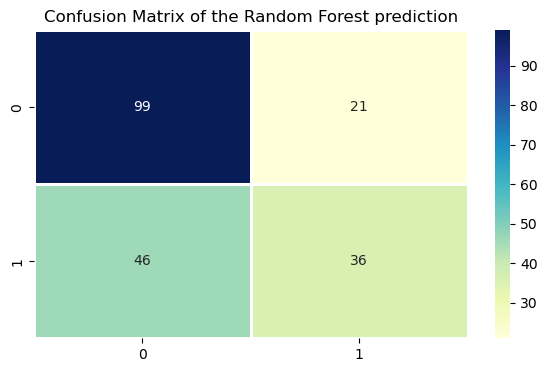

In [48]:
plt.figure(figsize=(7,4))
sns.heatmap(confrf, annot=True, cmap="YlGnBu", linewidths=.9, fmt='d')
plt.title('Confusion Matrix of the Random Forest prediction')
plt.show()

# 4-Using KNN Classifier 

In [49]:
from sklearn.neighbors import KNeighborsClassifier

In [50]:
knn = KNeighborsClassifier()
knn_model = knn.fit(X_train, y_train)

In [51]:
knn_pred = knn_model.predict(X_test)

In [52]:
#Accuracy of KNN
accuracy_score(y_test, knn_pred)

0.693069306930693

In [53]:
#Classification report of KNN:
print(classification_report(y_test, knn_pred))

              precision    recall  f1-score   support

           0       0.70      0.85      0.77       120
           1       0.68      0.46      0.55        82

    accuracy                           0.69       202
   macro avg       0.69      0.66      0.66       202
weighted avg       0.69      0.69      0.68       202



In [54]:
#Confusion matrix
confknn= confusion_matrix(y_test, knn_pred)
confknn

array([[102,  18],
       [ 44,  38]], dtype=int64)

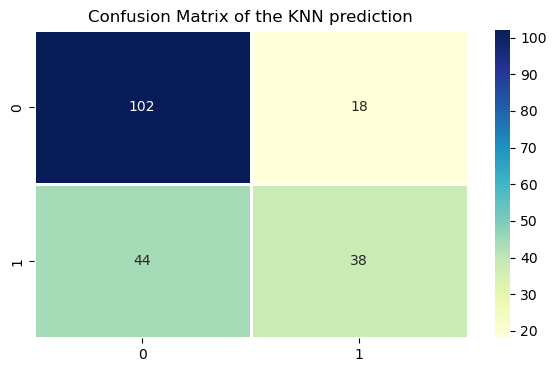

In [55]:
plt.figure(figsize=(7,4))
sns.heatmap(confknn, annot=True, cmap="YlGnBu", linewidths=.9, fmt='d')
plt.title('Confusion Matrix of the KNN prediction')
plt.show()

# 5- Using Support Vector Machine

In [56]:
from sklearn.svm import SVC, LinearSVC

In [57]:
model_svm = SVC(kernel='rbf', random_state = 42)

In [58]:
model_svm.fit(X_train, y_train)

SVC(random_state=42)

In [59]:
svm_pred = model_svm.predict(X_test)

In [60]:
#Accuracy Score of SVM
accuracy_score(y_test, svm_pred)

0.7128712871287128

In [61]:
#Classification report
print(classification_report(y_test, svm_pred))

              precision    recall  f1-score   support

           0       0.69      0.93      0.79       120
           1       0.79      0.40      0.53        82

    accuracy                           0.71       202
   macro avg       0.74      0.66      0.66       202
weighted avg       0.73      0.71      0.69       202



In [62]:
#Confusion Matrix:
confsvm= confusion_matrix(y_test, svm_pred)
confsvm

array([[111,   9],
       [ 49,  33]], dtype=int64)

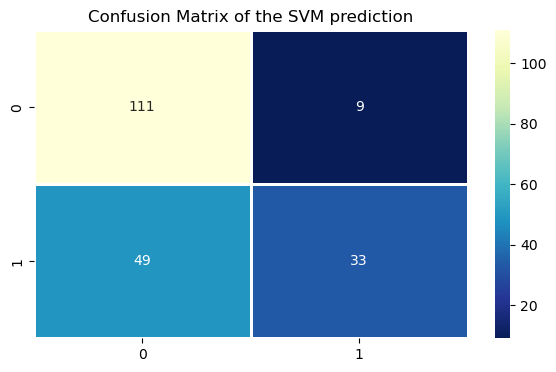

In [63]:
plt.figure(figsize=(7,4))
sns.heatmap(confsvm, annot=True, cmap="YlGnBu_r", linewidths=.9, fmt='d')
plt.title('Confusion Matrix of the SVM prediction')
plt.show()

In [64]:
import pickle

In [63]:
#svm_pred
with open('assets/svm_pred.pkl', 'wb') as f:
    pickle.dump(model_svm,f)

In [67]:
#svm_pred
with open('assets/svm_pred.pkl', 'rb') as f:
    another_pred=pickle.load(f)
    
another_pred.predict([(8.989900090557086,215.0473578931106,15921.412017954248,
                     6.29731152709713,312.93102150370726,390.4102306332045,
                     9.899115390205338,55.06930392643049,4.613842848013146
                      )])

array([0], dtype=int64)

In [68]:
another_pred.predict(X_test)

array([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1,
       1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 1, 0], dtype=int64)

In [70]:
X_test[4]

array([ 1.73068194,  0.7380858 ,  1.41371507,  1.65259393, -2.41181025,
       -0.73714444, -0.25842684, -0.21443261,  0.65568295])

# 6-Using XGBoost Classifier

In [ ]:
pip install xgboost


In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

In [69]:
xgb =XGBClassifier(eval_metric = 'logloss', use_label_encoder=False)

In [70]:
params_xgb = {'n_estimators': [50,100,250,400,600,800,1000], 'learning_rate': [0.2,0.5,0.8,1]}
rs_xgb =  RandomizedSearchCV(xgb, param_distributions=params_xgb, cv=5)

In [71]:
rs_xgb.fit(X_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric='logloss', gamma=None,
                                           gpu_id=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate=None, max_bin=...
                                           max_cat_to_onehot=None,
                                           max_delta_step=None, max_dep

In [72]:
xgb.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_to_onehot=4, max_delta_step=0, max_depth=6,
              max_leaves=0, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=0,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [73]:
xgb_pred = xgb.predict(X_test)

In [74]:
#Accuracy of XGBoost classifier
accuracy_score(y_test, xgb_pred)

0.6138613861386139

In [76]:
#Classification report:
print(classification_report(y_test, xgb_pred))

              precision    recall  f1-score   support

           0       0.65      0.74      0.70       120
           1       0.53      0.43      0.47        82

    accuracy                           0.61       202
   macro avg       0.59      0.58      0.58       202
weighted avg       0.60      0.61      0.61       202



In [77]:
#Confusion matrix :
confxgb= confusion_matrix(y_test, xgb_pred)
confxgb

array([[89, 31],
       [47, 35]], dtype=int64)

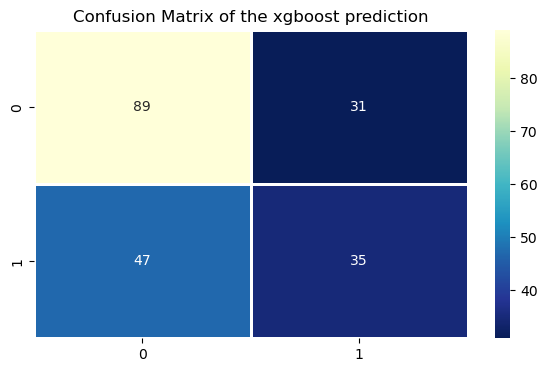

In [78]:
plt.figure(figsize=(7,4))
sns.heatmap(confxgb, annot=True, cmap="YlGnBu_r", linewidths=.9, fmt='d')
plt.title('Confusion Matrix of the xgboost prediction')
plt.show()